#### TODO

[ ] Test with 2 different supervised models

[ ] Attempts with 2 different types of features

[ ] Parameter Tunning

[ ] Comparison with random chance/supervised baseline

[ ] Interpretation of results

[ ] Documentation

##### Nice to have
[ ] Testing with a third method (Compare Isolation Forrest, which is the chosen method, with Random Forrest from literature)

[ ] Testing in transfer learning

In [ ]:
import os
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import math

import numpy as np
from scipy.stats import ks_2samp

from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, classification_report

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer

from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split

from sklearn.decomposition import PCA

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mishra5001/credit-card")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\andre\.cache\kagglehub\datasets\mishra5001\credit-card\versions\1


In [ ]:
files = os.listdir(path)
print("Files:", files)

Files: ['application_data.csv', 'columns_description.csv', 'previous_application.csv']


In [ ]:
dfs = {}
for file in files:
    if file.endswith(".csv"):
        file_path = os.path.join(path, file)
        dfs[file] = pd.read_csv(file_path, encoding='cp1252')

In [ ]:
application_data_df = dfs['application_data.csv']
columns_description_df = dfs['columns_description.csv']
previous_application_df = dfs['previous_application.csv']

# Example: access a specific DataFrame
application_data_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Display the columns description and show full description
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
    display(columns_description_df)

,Unnamed: 0,Table,Row,Description,Special
0,1,application_data,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_data,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,5,application_data,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_data,CODE_GENDER,Gender of the client,NaN
4,7,application_data,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_data,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_data,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_data,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_data,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_data,AMT_ANNUITY,Loan annuity,NaN


#### Potential features

- aggregated transactions (combine with grouping transactions | card holder and transaction type | country or merchant group)
- periodic feeatures -> estimate time of new transaction within confidence interval
- compare features: raw, aggregated, extended aggregated and periodic


# Bronze Layer

In [ ]:
df_application_bronze = application_data_df.copy()
df_previous_application_bronze = previous_application_df.copy()

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 10)

In [ ]:
df_application_bronze.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [ ]:
df_previous_application_bronze.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print("Missing values in application table:")
print(df_application_bronze.isnull().sum())
print("\nPercentage of missing values:")
print((df_application_bronze.isnull().sum() / len(df_application_bronze)) * 100)

Missing values in application table:
SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

Percentage of missing values:
SK_ID_CURR                     0.000000
TARGET                         0.000000
NAME_CONTRACT_TYPE             0.000000
CODE_GENDER                    0.000000
FLAG_OWN_CAR                   0.000000
                                ...    
AMT_REQ_CREDIT_BUREAU_DAY     13.501631
AMT_REQ_CREDIT_BUREAU_WEEK    13.501631
AMT_REQ_CREDIT_BUREAU_MON     13.501631
AMT_REQ_CREDIT_BUREAU_QRT     13.501631
AMT_REQ_CREDIT_BUREAU_YEAR    13.501631
Length: 122, dtype: float64


In [ ]:
print("Missing values in previous application table:")
print(df_previous_application_bronze.isnull().sum())
print("\nPercentage of missing values:")
print((df_previous_application_bronze.isnull().sum() / len(df_previous_application_bronze)) * 100)

Missing values in previous application table:
SK_ID_PREV                        0
SK_ID_CURR                        0
NAME_CONTRACT_TYPE                0
AMT_ANNUITY                  372235
AMT_APPLICATION                   0
                              ...  
DAYS_FIRST_DUE               673065
DAYS_LAST_DUE_1ST_VERSION    673065
DAYS_LAST_DUE                673065
DAYS_TERMINATION             673065
NFLAG_INSURED_ON_APPROVAL    673065
Length: 37, dtype: int64

Percentage of missing values:
SK_ID_PREV                    0.000000
SK_ID_CURR                    0.000000
NAME_CONTRACT_TYPE            0.000000
AMT_ANNUITY                  22.286665
AMT_APPLICATION               0.000000
                               ...    
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
Length: 37, dtype: float64


In [ ]:
def plot_feature_distributions(df, features, target_col="TARGET", bins=100, cols=2):
    """
    Plots distribution histograms for multiple features split by target classes.

    Parameters:
    - df : pd.DataFrame
    - features : list of str -> columns to plot
    - target_col : str -> name of target column (default: 'TARGET')
    - bins : int -> number of bins for histogram
    - cols : int -> number of columns in subplot grid
    """
    n_features = len(features)
    rows = math.ceil(n_features / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows))
    axes = axes.flatten() if n_features > 1 else [axes]

    for i, feature in enumerate(features):
        ax = axes[i]
        sns.histplot(df.loc[df[target_col] == 0, feature],
                     bins=bins, color="blue", label="Normal",
                     stat="density", alpha=0.5, ax=ax)
        sns.histplot(df.loc[df[target_col] == 1, feature],
                     bins=bins, color="red", label="Anomaly",
                     stat="density", alpha=0.5, ax=ax)
        ax.set_title(f"Distribution of {feature}")
        ax.legend()

    # Remove unused subplots if features < rows*cols
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [ ]:
y = df_application_bronze['TARGET']

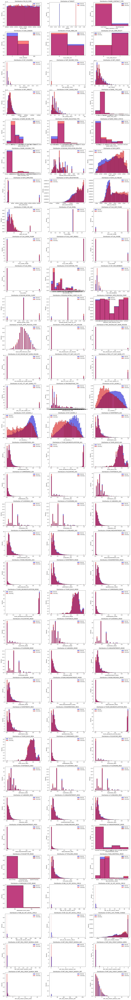

In [ ]:
features = [col for col in df_application_bronze.columns if not col.startswith("FLAG_DOCUMENT")]

plot_feature_distributions(df_application_bronze, features, target_col="TARGET", bins=50, cols=3)

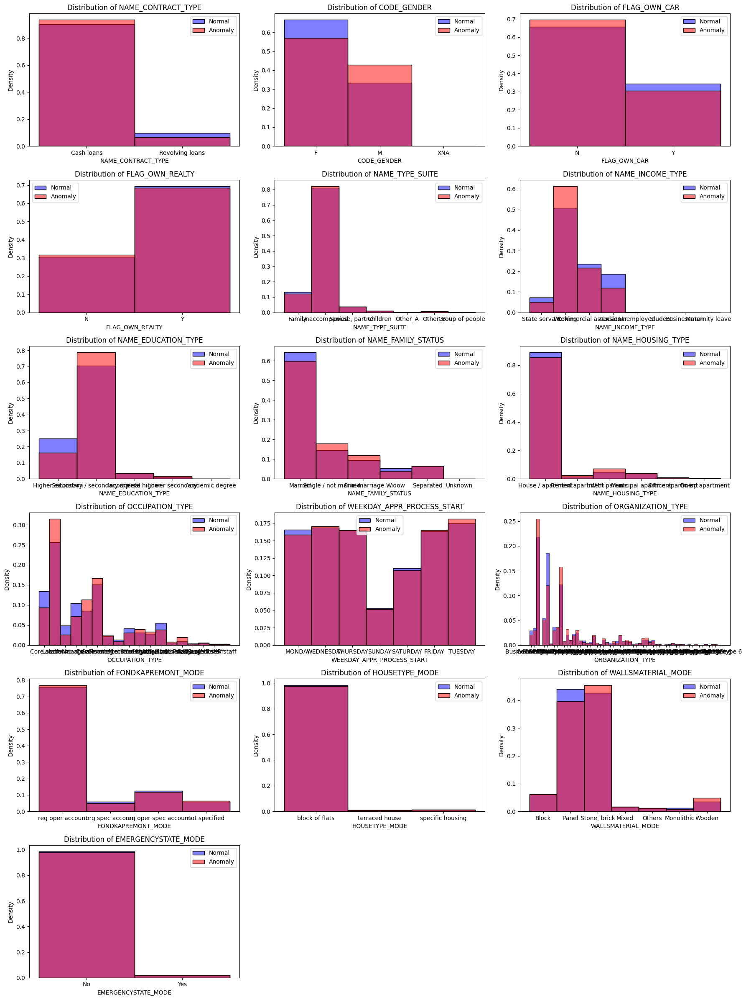

In [ ]:
# get categorical features
cat_features = [col for col in df_application_bronze.select_dtypes(include=['object','category']).columns
                if not col.startswith("FLAG_DOCUMENT")]

plot_feature_distributions(df_application_bronze, cat_features, target_col="TARGET", bins=50, cols=3)

# Silver Layer

### Transform and Aggregate ( IT SHOULD BE DATA CLEANING INSTEAD -> TRANSFORM AND AGGREGATE IN GOLD)

In [ ]:
# Silver Layer: Feature Engineering and Enrichment
print("\nSilver Layer: Creating New Features")

# Start with a copy of the main application data
df_silver = df_application_bronze.copy()

# 1. Feature Engineering on Numerical Columns
print("  - Engineering numerical features...")
# Convert days to years (absolute values for clarity)
df_silver['AGE_YEARS'] = abs(df_silver['DAYS_BIRTH']) / 365
df_silver['EMPLOYMENT_YEARS'] = abs(df_silver['DAYS_EMPLOYED']) / 365

# Create ratio features
df_silver['ANNUITY_INCOME_RATIO'] = df_silver['AMT_ANNUITY'] / df_silver['AMT_INCOME_TOTAL']
df_silver['CREDIT_INCOME_RATIO'] = df_silver['AMT_CREDIT'] / df_silver['AMT_INCOME_TOTAL']
df_silver['CREDIT_ANNUITY_RATIO'] = df_silver['AMT_CREDIT'] / df_silver['AMT_ANNUITY']
df_silver['EMPLOYMENT_AGE_RATIO'] = df_silver['EMPLOYMENT_YEARS'] / df_silver['AGE_YEARS']
df_silver['EMPLOYMENT_EXPERIENCE_RATIO'] = df_silver['DAYS_EMPLOYED'] / df_silver['DAYS_BIRTH']

# 2. Aggregation from previous applications
print("  - Aggregating features from previous applications...")
# Group by client ID and aggregate numerical features
prev_app_agg = df_previous_application_bronze.groupby('SK_ID_CURR').agg({
    'AMT_CREDIT': ['mean', 'sum'],
    'AMT_ANNUITY': ['mean'],
    'DAYS_DECISION': ['max']
})

# Rename columns for clarity
prev_app_agg.columns = ['_'.join(col).strip() for col in prev_app_agg.columns.values]
prev_app_agg = prev_app_agg.reset_index()

# Merge the aggregated features with the main dataframe
df_silver = pd.merge(df_silver, prev_app_agg, on='SK_ID_CURR', how='left')

print(df_silver[['SK_ID_CURR', 'TARGET', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AGE_YEARS', 'EMPLOYMENT_YEARS', 'ANNUITY_INCOME_RATIO', 'CREDIT_INCOME_RATIO', 'CREDIT_ANNUITY_RATIO','EMPLOYMENT_AGE_RATIO', 'EMPLOYMENT_EXPERIENCE_RATIO', 'AMT_CREDIT_mean', 'AMT_CREDIT_sum']].head())


Silver Layer: Creating New Features
  - Engineering numerical features...
  - Aggregating features from previous applications...
   SK_ID_CURR  TARGET  AMT_INCOME_TOTAL  AMT_CREDIT  AGE_YEARS  \
0      100002       1          202500.0    406597.5  25.920548   
1      100003       0          270000.0   1293502.5  45.931507   
2      100004       0           67500.0    135000.0  52.180822   
3      100006       0          135000.0    312682.5  52.068493   
4      100007       0          121500.0    513000.0  54.608219   

   EMPLOYMENT_YEARS  ANNUITY_INCOME_RATIO  CREDIT_INCOME_RATIO  \
0          1.745205              0.121978             2.007889   
1          3.254795              0.132217             4.790750   
2          0.616438              0.100000             2.000000   
3          8.326027              0.219900             2.316167   
4          8.323288              0.179963             4.222222   

   CREDIT_ANNUITY_RATIO  EMPLOYMENT_AGE_RATIO  EMPLOYMENT_EXPERIENCE_RATIO  

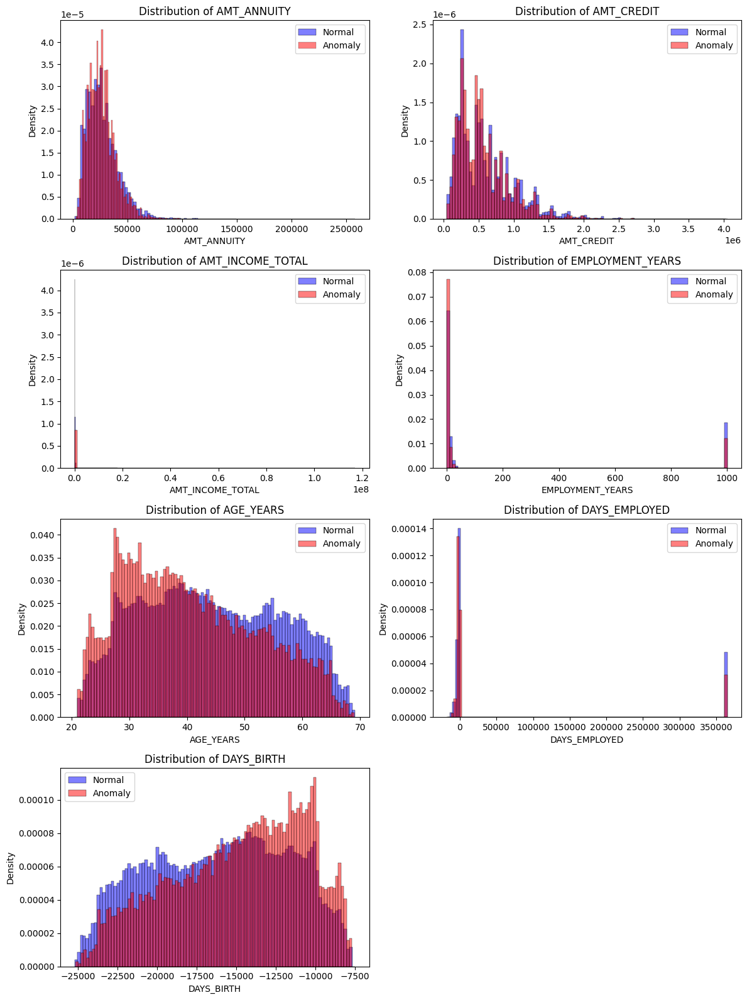

In [ ]:
raw_ratio_features = [
    "AMT_ANNUITY",
    "AMT_CREDIT",
    "AMT_INCOME_TOTAL",
    "EMPLOYMENT_YEARS",
    "AGE_YEARS",
    "DAYS_EMPLOYED",
    "DAYS_BIRTH"
]

plot_feature_distributions(df_silver, raw_ratio_features)

In [ ]:
# Make a silver dataframe with mean of flag_document columns and target

df_flag_mean = pd.DataFrame()

df_flag_mean["FLAG_DOCUMENT_MEAN"] = df_silver.filter(like='FLAG_DOCUMENT').mean(axis=1)
df_flag_mean["TARGET"] = df_silver["TARGET"]

df_flag_mean.head()

,FLAG_DOCUMENT_MEAN,TARGET
0,0.05,1
1,0.05,0
2,0.00,0
3,0.05,0
4,0.05,0


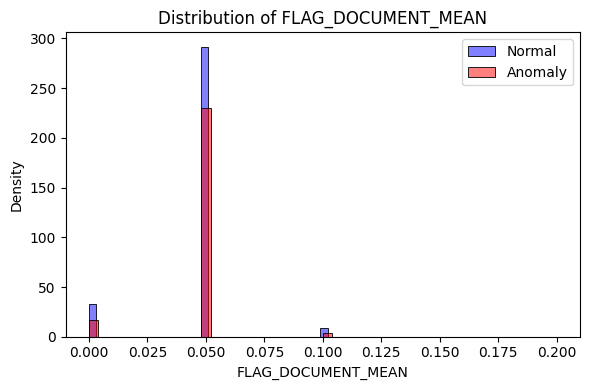

In [ ]:
flag_mean_ratio_column = ['FLAG_DOCUMENT_MEAN']

plot_feature_distributions(df_flag_mean, flag_mean_ratio_column, target_col="TARGET", bins=50, cols=1)

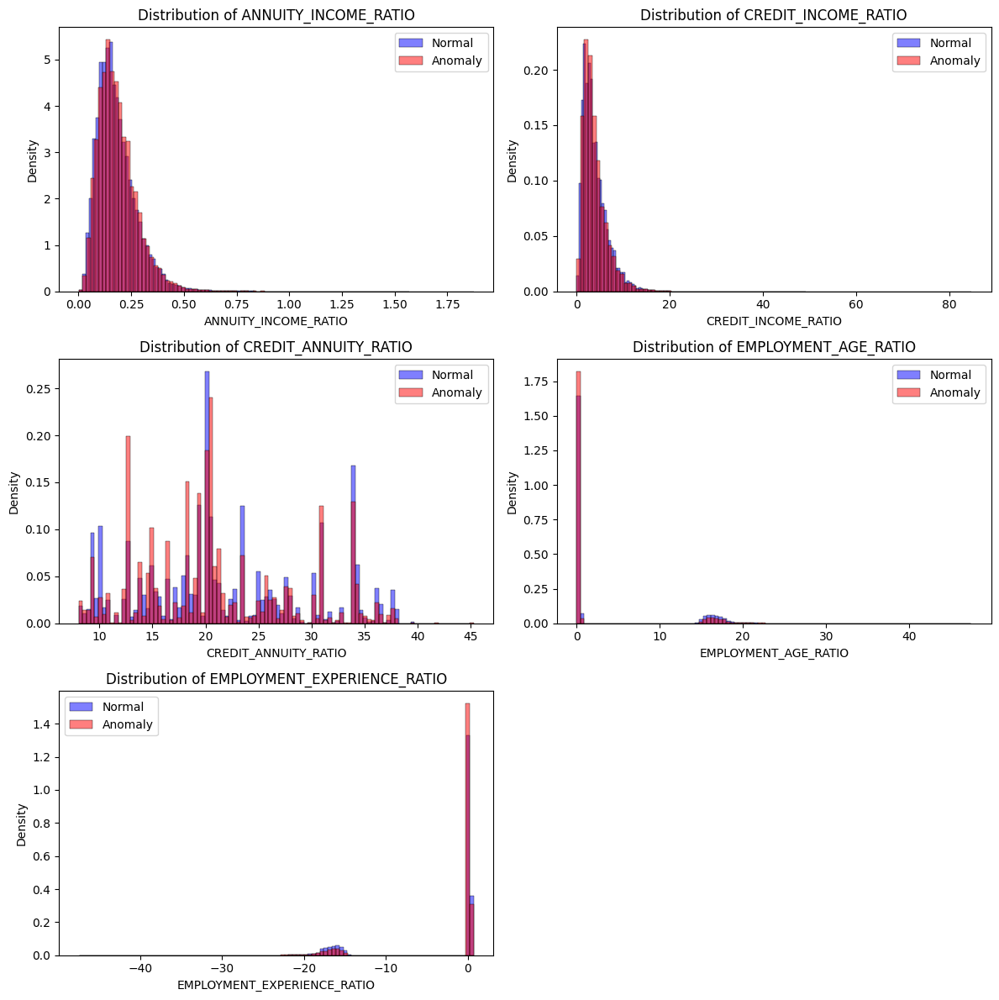

In [ ]:
ratio_features = [
    'ANNUITY_INCOME_RATIO',
    'CREDIT_INCOME_RATIO',
    'CREDIT_ANNUITY_RATIO',
    'EMPLOYMENT_AGE_RATIO',
    'EMPLOYMENT_EXPERIENCE_RATIO'
]

plot_feature_distributions(df_silver, ratio_features)


In [ ]:
stat, p = ks_2samp(df_silver.loc[y==0, "CREDIT_INCOME_RATIO"],
                   df_silver.loc[y==1, "CREDIT_INCOME_RATIO"])
print(f"KS p-value = {p}")


KS p-value = 8.241630323826908e-15


In [ ]:
df_ext_sources = df_silver[
    [
    # "SK_ID_PREV",
    # "SK_ID_CURR",
    "EXT_SOURCE_1",
    "EXT_SOURCE_2",
    "EXT_SOURCE_3",
    "TARGET"
    ]
].copy()

df_ext_sources.head()

,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,TARGET
0,0.083037,0.262949,0.139376,1
1,0.311267,0.622246,NaN,0
2,NaN,0.555912,0.729567,0
3,NaN,0.650442,NaN,0
4,NaN,0.322738,NaN,0


In [ ]:
global_rate = df_ext_sources["TARGET"].mean()

In [ ]:
df_ext_sources_transformed = pd.DataFrame()

df_ext_sources["EXT_SOURCE_1_LOG"] = np.log1p(df_ext_sources["EXT_SOURCE_1"])
df_ext_sources["EXT_SOURCE_1_SQRT"] = np.sqrt(df_ext_sources["EXT_SOURCE_1"])
df_ext_sources["EXT_SOURCE_1_SQUARE"] = df_ext_sources["EXT_SOURCE_1"] ** 2
df_ext_sources["EXT_SOURCE_1_BINNED"] = pd.qcut(df_ext_sources["EXT_SOURCE_1"], q=10, labels=False)

bins = np.linspace(0, 1, 20)  # split into 20 bins
df_ext_sources["EXT_SOURCE_1_BIN"] = np.digitize(df_ext_sources["EXT_SOURCE_1"], bins)

risk_map = df_ext_sources.groupby("EXT_SOURCE_1_BIN")["TARGET"].mean() / global_rate
df_ext_sources["EXT_SOURCE_1_RISK"] = df_ext_sources["EXT_SOURCE_1_BIN"].map(risk_map)


In [ ]:
df_ext_sources["EXT_SOURCE_2_LOG"] = np.log1p(df_ext_sources["EXT_SOURCE_2"])
df_ext_sources["EXT_SOURCE_2_SQRT"] = np.sqrt(df_ext_sources["EXT_SOURCE_2"])
df_ext_sources["EXT_SOURCE_2_SQUARE"] = df_ext_sources["EXT_SOURCE_2"] ** 2
df_ext_sources["EXT_SOURCE_2_BINNED"] = pd.qcut(df_ext_sources["EXT_SOURCE_2"], q=10, labels=False)

bins = np.linspace(0, 1, 20)  # split into 20 bins
df_ext_sources["EXT_SOURCE_2_BIN"] = np.digitize(df_ext_sources["EXT_SOURCE_2"], bins)

risk_map = df_ext_sources.groupby("EXT_SOURCE_2_BIN")["TARGET"].mean() / global_rate
df_ext_sources["EXT_SOURCE_2_RISK"] = df_ext_sources["EXT_SOURCE_2_BIN"].map(risk_map)

In [ ]:
df_ext_sources["EXT_SOURCE_3_LOG"] = np.log1p(df_ext_sources["EXT_SOURCE_3"])
df_ext_sources["EXT_SOURCE_3_SQRT"] = np.sqrt(df_ext_sources["EXT_SOURCE_3"])
df_ext_sources["EXT_SOURCE_3_SQUARE"] = df_ext_sources["EXT_SOURCE_3"] ** 2
df_ext_sources["EXT_SOURCE_3_BINNED"] = pd.qcut(df_ext_sources["EXT_SOURCE_3"], q=10, labels=False)

bins = np.linspace(0, 1, 20)  # split into 20 bins
df_ext_sources["EXT_SOURCE_3_BIN"] = np.digitize(df_ext_sources["EXT_SOURCE_3"], bins)

risk_map = df_ext_sources.groupby("EXT_SOURCE_3_BIN")["TARGET"].mean() / global_rate
df_ext_sources["EXT_SOURCE_3_RISK"] = df_ext_sources["EXT_SOURCE_3_BIN"].map(risk_map)

In [ ]:
df_ext_sources.head()

,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,TARGET,EXT_SOURCE_1_LOG,EXT_SOURCE_1_SQRT,EXT_SOURCE_1_SQUARE,EXT_SOURCE_1_BINNED,EXT_SOURCE_1_BIN,EXT_SOURCE_1_RISK,EXT_SOURCE_2_LOG,EXT_SOURCE_2_SQRT,EXT_SOURCE_2_SQUARE,EXT_SOURCE_2_BINNED,EXT_SOURCE_2_BIN,EXT_SOURCE_2_RISK,EXT_SOURCE_3_LOG,EXT_SOURCE_3_SQRT,EXT_SOURCE_3_SQUARE,EXT_SOURCE_3_BINNED,EXT_SOURCE_3_BIN,EXT_SOURCE_3_RISK
0,0.083037,0.262949,0.139376,1,0.079769,0.288161,0.006895,0.0,2,2.883216,0.233449,0.512785,0.069142,1.0,5,1.616227,0.130481,0.373331,0.019426,0.0,3,2.554681
1,0.311267,0.622246,NaN,0,0.270994,0.557913,0.096887,2.0,6,1.248871,0.483811,0.788826,0.387190,6.0,12,0.777947,NaN,NaN,NaN,NaN,20,1.153479
2,NaN,0.555912,0.729567,0,NaN,NaN,NaN,NaN,20,1.055328,0.442062,0.745595,0.309038,4.0,11,0.903639,0.547871,0.854147,0.532268,8.0,14,0.451309
3,NaN,0.650442,NaN,0,NaN,NaN,NaN,NaN,20,1.055328,0.501043,0.806500,0.423074,7.0,13,0.632591,NaN,NaN,NaN,NaN,20,1.153479
4,NaN,0.322738,NaN,0,NaN,NaN,NaN,NaN,20,1.055328,0.279704,0.568101,0.104160,1.0,7,1.368343,NaN,NaN,NaN,NaN,20,1.153479


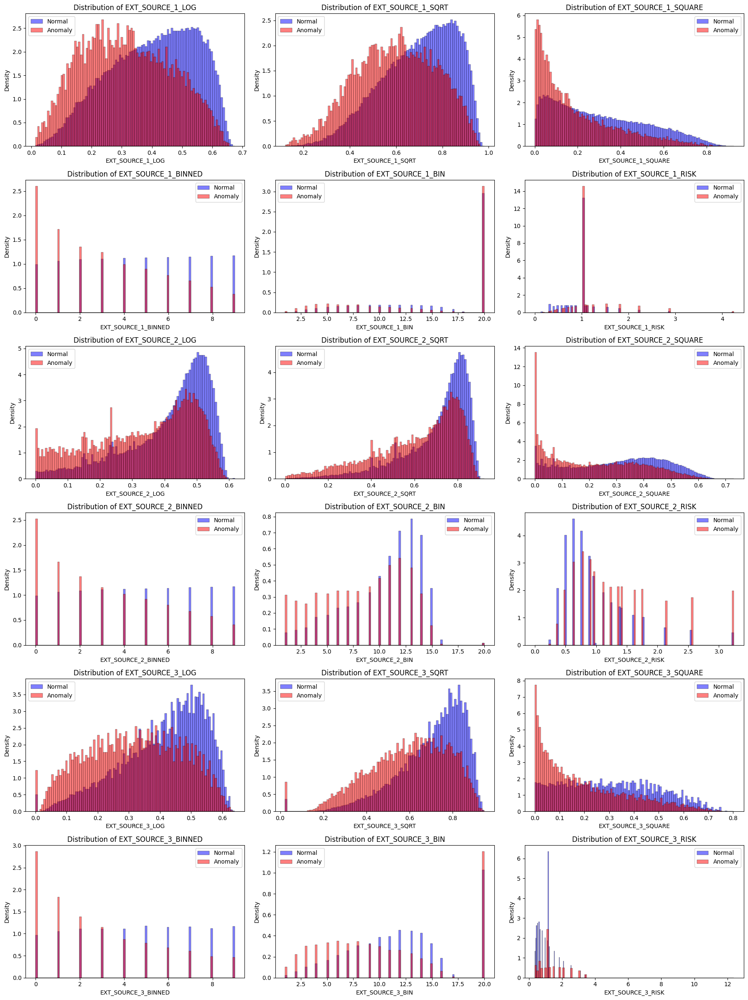

In [ ]:
ext_source_features = [
    'EXT_SOURCE_1_LOG',
    'EXT_SOURCE_1_SQRT',
    'EXT_SOURCE_1_SQUARE',
    'EXT_SOURCE_1_BINNED',
    'EXT_SOURCE_1_BIN',
    'EXT_SOURCE_1_RISK',
    'EXT_SOURCE_2_LOG',
    'EXT_SOURCE_2_SQRT',
    'EXT_SOURCE_2_SQUARE',
    'EXT_SOURCE_2_BINNED',
    'EXT_SOURCE_2_BIN',
    'EXT_SOURCE_2_RISK',
    'EXT_SOURCE_3_LOG',
    'EXT_SOURCE_3_SQRT',
    'EXT_SOURCE_3_SQUARE',
    'EXT_SOURCE_3_BINNED',
    'EXT_SOURCE_3_BIN',
    'EXT_SOURCE_3_RISK'
]

plot_feature_distributions(df_ext_sources, ext_source_features, target_col="TARGET", bins=100, cols=3)

In [ ]:
risk_map = df_silver.groupby("ORGANIZATION_TYPE")["TARGET"].mean() / global_rate
df_silver["ORGANIZATION_TYPE_RISK"] = df_silver["ORGANIZATION_TYPE"].map(risk_map)

risk_map = df_silver.groupby("OCCUPATION_TYPE")["TARGET"].mean() / global_rate
df_silver["OCCUPATION_TYPE_RISK"] = df_silver["OCCUPATION_TYPE"].map(risk_map)

In [ ]:
df_silver[["ORGANIZATION_TYPE", "OCCUPATION_TYPE"]].head()

,ORGANIZATION_TYPE,OCCUPATION_TYPE
0,Business Entity Type 3,Laborers
1,School,Core staff
2,Government,Laborers
3,Business Entity Type 3,Laborers
4,Religion,Core staff


In [ ]:
df_silver[["ORGANIZATION_TYPE_RISK", "OCCUPATION_TYPE_RISK"]].head()

,ORGANIZATION_TYPE_RISK,OCCUPATION_TYPE_RISK
0,1.151958,1.310408
1,0.732671,0.780880
2,0.864386,1.310408
3,1.151958,1.310408
4,0.728656,0.780880


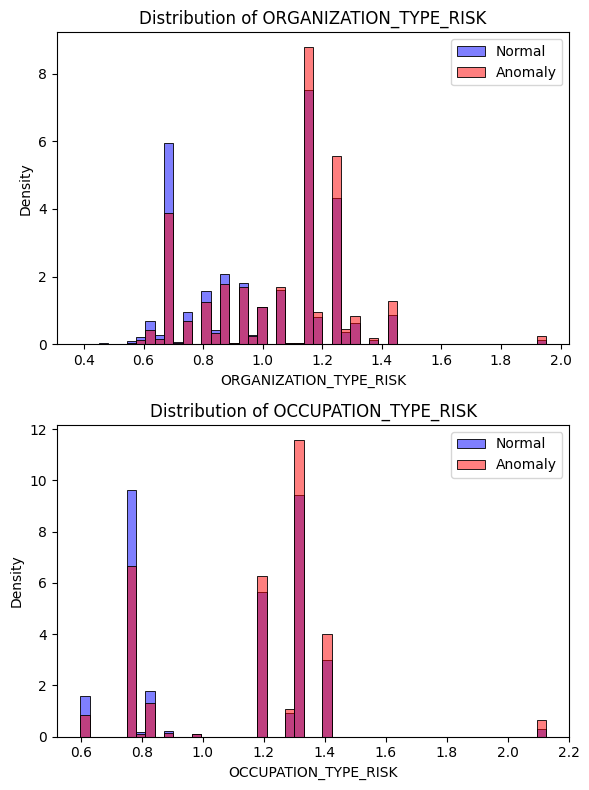

In [ ]:
categoricals_for_risk = [
    "ORGANIZATION_TYPE_RISK",
    "OCCUPATION_TYPE_RISK"
]

plot_feature_distributions(df_silver, categoricals_for_risk, target_col="TARGET", bins=50, cols=1)

In [ ]:
# CREDIT_ANNUITY_RATIO × OCCUPATION_TYPE_RISK

df_silver["CREDIT_ANNUITY_OCCUPATION_RISK"] = df_silver["CREDIT_ANNUITY_RATIO"] * df_silver["OCCUPATION_TYPE_RISK"]
df_silver[["CREDIT_ANNUITY_OCCUPATION_RISK"]].head()

,CREDIT_ANNUITY_OCCUPATION_RISK
0,21.570764
1,28.294479
2,26.208162
3,13.802290
4,18.320712


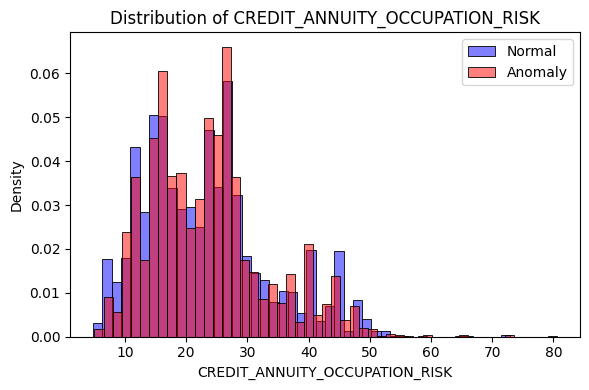

In [ ]:
categoricals_for_risk = [
    "CREDIT_ANNUITY_OCCUPATION_RISK"
]

plot_feature_distributions(df_silver, categoricals_for_risk, target_col="TARGET", bins=50, cols=1)

In [ ]:
# Bin CREDIT_ANNUITY_OCCUPATION_RISK

bins = np.linspace(df_silver["CREDIT_ANNUITY_OCCUPATION_RISK"].min(), df_silver["CREDIT_ANNUITY_OCCUPATION_RISK"].max(), 35)
df_silver["CREDIT_ANNUITY_OCCUPATION_RISK_BIN"] = np.digitize(df_silver["CREDIT_ANNUITY_OCCUPATION_RISK"], bins)
df_silver[["CREDIT_ANNUITY_OCCUPATION_RISK_BIN"]].head()

,CREDIT_ANNUITY_OCCUPATION_RISK_BIN
0,8
1,11
2,10
3,5
4,7


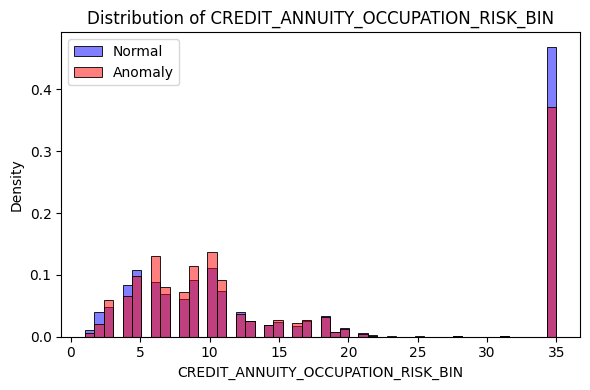

In [ ]:
categoricals_for_risk = [
    "CREDIT_ANNUITY_OCCUPATION_RISK_BIN"
]

plot_feature_distributions(df_silver, categoricals_for_risk, target_col="TARGET", bins=50, cols=1)

In [ ]:
# ORGANIZATION_TYPE_RISK × OCCUPATION_TYPE_RISK

df_silver["ORGANIZATION_OCCUPATION_RISK"] = df_silver["ORGANIZATION_TYPE_RISK"] * df_silver["OCCUPATION_TYPE_RISK"]
df_silver[["ORGANIZATION_OCCUPATION_RISK"]].head()

,ORGANIZATION_OCCUPATION_RISK
0,1.509536
1,0.572128
2,1.132698
3,1.509536
4,0.568993


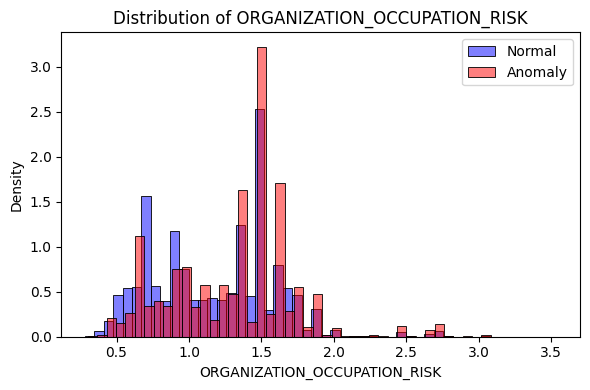

In [ ]:
categoricals_for_risk = [
    "ORGANIZATION_OCCUPATION_RISK"
]

plot_feature_distributions(df_silver, categoricals_for_risk, target_col="TARGET", bins=50, cols=1)

In [ ]:
def evaluate_feature_goodness(df, features, target_col="is_anomaly"):
    results = []

    for feature in features:
        try:
            # Drop NaN for clean comparison
            data = df[[feature, target_col]].dropna()

            # Separate distributions
            normal = data[data[target_col] == 0][feature]
            anomaly = data[data[target_col] == 1][feature]

            # KS test
            ks_stat, ks_pvalue = ks_2samp(normal, anomaly)

            # AUROC (feature as classifier)
            try:
                auc = roc_auc_score(data[target_col], data[feature])
            except Exception:
                auc = np.nan  # For categorical encodings that aren’t numeric

            results.append({
                "feature": feature,
                "ks_stat": ks_stat,
                "ks_pvalue": ks_pvalue,
                "auc": auc,
                "normal_mean": normal.mean(),
                "anomaly_mean": anomaly.mean()
            })

        except Exception as e:
            print(f"Skipping {feature} due to error: {e}")

    return pd.DataFrame(results).sort_values(by="auc", ascending=False)

In [ ]:
# set pandas to display all rows and full column width
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

In [ ]:
df_silver[["CREDIT_ANNUITY_RATIO",
    "AMT_INCOME_TOTAL",
    "CREDIT_ANNUITY_OCCUPATION_RISK",
    "CREDIT_ANNUITY_OCCUPATION_RISK_BIN",
    "ORGANIZATION_TYPE_RISK",
    "OCCUPATION_TYPE_RISK",
    "ORGANIZATION_OCCUPATION_RISK",
    "ORGANIZATION_TYPE",
    "OCCUPATION_TYPE",
    "NAME_EDUCATION_TYPE",
    "NAME_INCOME_TYPE"]].head()

,CREDIT_ANNUITY_RATIO,AMT_INCOME_TOTAL,CREDIT_ANNUITY_OCCUPATION_RISK,CREDIT_ANNUITY_OCCUPATION_RISK_BIN,ORGANIZATION_TYPE_RISK,OCCUPATION_TYPE_RISK,ORGANIZATION_OCCUPATION_RISK,ORGANIZATION_TYPE,OCCUPATION_TYPE,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE
0,16.461104,202500.0,21.570764,8,1.151958,1.310408,1.509536,Business Entity Type 3,Laborers,Secondary / secondary special,Working
1,36.234085,270000.0,28.294479,11,0.732671,0.780880,0.572128,School,Core staff,Higher education,State servant
2,20.000000,67500.0,26.208162,10,0.864386,1.310408,1.132698,Government,Laborers,Secondary / secondary special,Working
3,10.532818,135000.0,13.802290,5,1.151958,1.310408,1.509536,Business Entity Type 3,Laborers,Secondary / secondary special,Working
4,23.461618,121500.0,18.320712,7,0.728656,0.780880,0.568993,Religion,Core staff,Secondary / secondary special,Working


In [ ]:
features = [
    "CREDIT_ANNUITY_RATIO",
    "AMT_INCOME_TOTAL",
    "CREDIT_ANNUITY_OCCUPATION_RISK",
    "CREDIT_ANNUITY_OCCUPATION_RISK_BIN",
    "ORGANIZATION_TYPE_RISK",
    "OCCUPATION_TYPE_RISK",
    "ORGANIZATION_OCCUPATION_RISK",
    "ORGANIZATION_TYPE",
    "OCCUPATION_TYPE",
    "NAME_EDUCATION_TYPE",
    "NAME_INCOME_TYPE"
]

results = evaluate_feature_goodness(df_silver, features, target_col="TARGET")
print(results)

Skipping ORGANIZATION_TYPE due to error: Could not convert string 'SchoolGovernmentBusiness Entity Type 3ReligionOtherBusiness Entity Type 3OtherXNAElectricityMedicineXNABusiness Entity Type 2Self-employedTransport: type 2Business Entity Type 2GovernmentConstructionHousingKindergartenSelf-employedTrade: type 7Self-employedXNABusiness Entity Type 3Business Entity Type 3Industry: type 11MilitaryBusiness Entity Type 3Business Entity Type 3ServicesBusiness Entity Type 2Self-employedSecurity MinistriesSelf-employedOtherTransport: type 4XNABusiness Entity Type 3Industry: type 1XNABusiness Entity Type 3Self-employedXNABusiness Entity Type 3GovernmentTransport: type 2SchoolServicesEmergencySelf-employedXNAMedicineXNASecurityTransport: type 4Business Entity Type 3Industry: type 11Trade: type 2XNAUniversityTransport: type 3PoliceGovernmentConstructionKindergartenOtherBusiness Entity Type 3Business Entity Type 3Business Entity Type 3Business Entity Type 1Self-employedSelf-employedSchoolSelf-emplo

In [ ]:
print(results)

                              feature   ks_stat      ks_pvalue       auc  \
6        ORGANIZATION_OCCUPATION_RISK  0.136048  1.406420e-273  0.590868   
5                OCCUPATION_TYPE_RISK  0.130725  1.529302e-252  0.576818   
4              ORGANIZATION_TYPE_RISK  0.116168  9.164815e-269  0.574274   
2      CREDIT_ANNUITY_OCCUPATION_RISK  0.063965   1.271809e-60  0.517082   
1                    AMT_INCOME_TOTAL  0.037375   3.913655e-28  0.480861   
3  CREDIT_ANNUITY_OCCUPATION_RISK_BIN  0.070053   7.967952e-98  0.475564   
0                CREDIT_ANNUITY_RATIO  0.094598  3.434224e-178  0.467944   

     normal_mean   anomaly_mean  
6       1.176945       1.314939  
5       1.080986       1.163296  
4       0.994767       1.059590  
2      23.195835      23.555722  
1  169077.722266  165611.760906  
3      17.118640      15.503968  
0      21.686752      20.764818  


In [ ]:
ext_src_features = [
    "EXT_SOURCE_1",
    "EXT_SOURCE_2",
    "EXT_SOURCE_3",
    "EXT_SOURCE_1_LOG",
    "EXT_SOURCE_1_SQRT",
    "EXT_SOURCE_1_SQUARE",
    "EXT_SOURCE_1_BINNED",
    "EXT_SOURCE_1_BIN",
    "EXT_SOURCE_1_RISK",
    "EXT_SOURCE_2_LOG",
    "EXT_SOURCE_2_SQRT",
    "EXT_SOURCE_2_SQUARE",
    "EXT_SOURCE_2_BINNED",
    "EXT_SOURCE_2_BIN",
    "EXT_SOURCE_2_RISK",
    "EXT_SOURCE_3_LOG",
    "EXT_SOURCE_3_SQRT",
    "EXT_SOURCE_3_SQUARE",
    "EXT_SOURCE_3_BINNED",
    "EXT_SOURCE_3_BIN",
    "EXT_SOURCE_3_RISK"
]

results = evaluate_feature_goodness(df_ext_sources, ext_src_features, target_col="TARGET")
print(results)

                feature   ks_stat      ks_pvalue       auc  normal_mean  \
20    EXT_SOURCE_3_RISK  0.229603   0.000000e+00  0.658277     0.971168   
14    EXT_SOURCE_2_RISK  0.221644   0.000000e+00  0.654458     0.972572   
8     EXT_SOURCE_1_RISK  0.119575  8.785998e-285  0.589005     0.987951   
7      EXT_SOURCE_1_BIN  0.085641  4.544339e-146  0.487661    15.706639   
19     EXT_SOURCE_3_BIN  0.196463   0.000000e+00  0.405730    12.275822   
12  EXT_SOURCE_2_BINNED  0.221739   0.000000e+00  0.346914     4.623530   
13     EXT_SOURCE_2_BIN  0.221644   0.000000e+00  0.345981    10.469150   
11  EXT_SOURCE_2_SQUARE  0.223739   0.000000e+00  0.343880     0.308729   
9      EXT_SOURCE_2_LOG  0.223739   0.000000e+00  0.343880     0.412816   
1          EXT_SOURCE_2  0.223739   0.000000e+00  0.343880     0.523479   
10    EXT_SOURCE_2_SQRT  0.223739   0.000000e+00  0.343880     0.706889   
6   EXT_SOURCE_1_BINNED  0.240142   0.000000e+00  0.337419     4.621846   
0          EXT_SOURCE_1  

### Relevant features discovered:
- CREDIT_ANNUITY_RATIO
- AMT_INCOME_TOTAL

- CREDIT_ANNUITY_OCCUPATION_RISK
- CREDIT_ANNUITY_OCCUPATION_RISK_BIN

- ORGANIZATION_TYPE_RISK
- OCCUPATION_TYPE_RISK

- ORGANIZATION_OCCUPATION_RISK

##### CATEGORICAL

- ORGANIZATION_TYPE-> from 0.025 to 0.15
- OCCUPATION_TYPE -> from 0.40 to 0.175
- NAME_EDUCATION_TYPE -> from 0.02 to 0.10
- NAME_INCOME_TYPE -> from 0.0 to 0.4


### EXT Features
(raw numeric)
- EXT_SOURCE_1,
- EXT_SOURCE_2,
- EXT_SOURCE_3

- EXT_SOURCE_1_RISK,
- EXT_SOURCE_2_RISK,
- EXT_SOURCE_3_RISK


### Features to use
- ORGANIZATION_OCCUPATION_RISK
- OCCUPATION_TYPE_RISK
- ORGANIZATION_TYPE_RISK
- CREDIT_ANNUITY_OCCUPATION_RISK
- EXT_SOURCE_1,
- EXT_SOURCE_2,
- EXT_SOURCE_3

- EXT_SOURCE_1_RISK,
- EXT_SOURCE_2_RISK,
- EXT_SOURCE_3_RISK


# Gold Layer

In [ ]:
df_silver.drop(columns=["ANNUITY_INCOME_RATIO", "CREDIT_INCOME_RATIO", "EMPLOYMENT_AGE_RATIO", "EMPLOYMENT_EXPERIENCE_RATIO" ], inplace=True)
df_silver.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE_YEARS,EMPLOYMENT_YEARS,CREDIT_ANNUITY_RATIO,AMT_CREDIT_mean,AMT_CREDIT_sum,AMT_ANNUITY_mean,DAYS_DECISION_max
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,25.920548,1.745205,16.461104,179055.00,179055.0,9251.775,-606.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,45.931507,3.254795,36.234085,484191.00,1452573.0,56553.990,-746.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0

In [ ]:
df_gold = pd.DataFrame()

In [ ]:
# Gold Layer: Final Model-Ready Data
df_gold = df_silver[[
    "ORGANIZATION_OCCUPATION_RISK",
    "OCCUPATION_TYPE_RISK",
    "ORGANIZATION_TYPE_RISK",
    "CREDIT_ANNUITY_OCCUPATION_RISK"
]].copy()

df_gold = df_gold.join(
    df_ext_sources[[
        "EXT_SOURCE_1",
        "EXT_SOURCE_2",
        "EXT_SOURCE_3",
        "EXT_SOURCE_1_RISK",
        "EXT_SOURCE_2_RISK",
        "EXT_SOURCE_3_RISK"
    ]],
    how="left"
)

df_gold["TARGET"] = df_silver["TARGET"]

# 1. Handle Categorical Features
print("\n Gold Layer: Handling Categorical Features ")
# Use one-hot encoding for categorical columns
categorical_cols = [col for col in df_gold.columns if df_gold[col].dtype == "object"]
if categorical_cols:
    df_gold = pd.get_dummies(df_gold, columns=categorical_cols, dummy_na=False)

df_gold.head()


 Gold Layer: Handling Categorical Features 


,ORGANIZATION_OCCUPATION_RISK,OCCUPATION_TYPE_RISK,ORGANIZATION_TYPE_RISK,CREDIT_ANNUITY_OCCUPATION_RISK,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,EXT_SOURCE_1_RISK,EXT_SOURCE_2_RISK,EXT_SOURCE_3_RISK,TARGET
0,1.509536,1.310408,1.151958,21.570764,0.083037,0.262949,0.139376,2.883216,1.616227,2.554681,1
1,0.572128,0.780880,0.732671,28.294479,0.311267,0.622246,NaN,1.248871,0.777947,1.153479,0
2,1.132698,1.310408,0.864386,26.208162,NaN,0.555912,0.729567,1.055328,0.903639,0.451309,0
3,1.509536,1.310408,1.151958,13.802290,NaN,0.650442,NaN,1.055328,0.632591,1.153479,0
4,0.568993,0.780880,0.728656,18.320712,NaN,0.322738,NaN,1.055328,1.368343,1.153479,0


In [ ]:
# Select Features and Target
print("  - Selecting features and target...")
# Separate features (X) from the target (y)
X = df_gold.drop(['TARGET'], axis=1) # Exclude TARGET and ID for unsupervised model training
y = df_gold['TARGET'] # Save TARGET for later evaluation

  - Selecting features and target...


In [ ]:
# Add missingness indicators

# TODO: - HANDLE THE MISSING VALUES INSIDE THE TABLE THEN ASSING TO X
for col in X.columns:
    if X[col].isna().any():
        X[f"{col}_missing"] = X[col].isna().astype(int)

In [ ]:
imputer = SimpleImputer(strategy="median")
X_imputed = imputer.fit_transform(X)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

print("Gold Layer: Data Ready for Model Training")
print(f"  - Features (X_scaled): {X_scaled.shape}")
print(f"  - Target (y): {y.shape}")

Gold Layer: Data Ready for Model Training
  - Features (X_scaled): (307511, 9)
  - Target (y): (307511,)


In [ ]:
# X_scaled: The standardized feature data
# y: The target variable (TARGET) for evaluation

# Split the data
X_train_scaled, X_test_scaled, _, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)
fraud_rate = y.value_counts()[1] / len(y)

print(" Implementing One-Class SVM ")
# The 'nu' parameter is an upper bound on the fraction of training errors
# and a lower bound of the fraction of support vectors.
# We'll set a reasonable value, e.g., 0.01, assuming a small percentage of anomalies.
oc_svm = OneClassSVM(kernel='rbf', nu=fraud_rate)

# Train the One-Class SVM model on the training data.
# Note: The model is fit to the features (X_train) without using y_train.
oc_svm.fit(X_train_scaled)

print(" Implementing Isolation Forest ---")
# The 'contamination' parameter is the expected proportion of outliers in the data.
# This value should be set based on your domain knowledge of the data.
# For this dataset, we can assume a small fraction of anomalies.

iso_forest = IsolationForest(contamination=fraud_rate, n_estimators=300, random_state=42)


# Train the Isolation Forest model on the training data.
# It also does not use the target variable for training.
iso_forest.fit(X_train_scaled)

print("\nModels have been trained successfully!")

 Implementing One-Class SVM 
 Implementing Isolation Forest ---

Models have been trained successfully!


In [ ]:
# Make predictions on the test set
# For One-Class SVM, a positive prediction (1) means normal, negative (-1) means an anomaly.
oc_svm_preds = oc_svm.predict(X_test_scaled)

# For Isolation Forest, the output is also 1 for inliers and -1 for outliers.
iso_forest_preds = iso_forest.predict(X_test_scaled)

# Convert the true labels (y_test) to the same -1/1 format for comparison
# 0 -> 1 (normal), 1 -> -1 (anomaly)
y_test_converted = y_test.apply(lambda x: -1 if x == 1 else 1)

In [ ]:
print("\n Evaluation: One-Class SVM ")
print("Confusion Matrix:")
print(confusion_matrix(y_test_converted, oc_svm_preds))
print("\nClassification Report:")
print(classification_report(y_test_converted, oc_svm_preds, target_names=['Anomaly', 'Normal']))


 Evaluation: One-Class SVM 
Confusion Matrix:
[[ 1166  6247]
 [ 6417 78424]]

Classification Report:
              precision    recall  f1-score   support

     Anomaly       0.15      0.16      0.16      7413
      Normal       0.93      0.92      0.93     84841

    accuracy                           0.86     92254
   macro avg       0.54      0.54      0.54     92254
weighted avg       0.86      0.86      0.86     92254



In [ ]:
print("\n Evaluation: Isolation Forest ")
print("Confusion Matrix:")
print(confusion_matrix(y_test_converted, iso_forest_preds))
print("\nClassification Report:")
print(classification_report(y_test_converted, iso_forest_preds, target_names=['Anomaly', 'Normal']))


 Evaluation: Isolation Forest 
Confusion Matrix:
[[ 1517  5896]
 [ 6033 78808]]

Classification Report:
              precision    recall  f1-score   support

     Anomaly       0.20      0.20      0.20      7413
      Normal       0.93      0.93      0.93     84841

    accuracy                           0.87     92254
   macro avg       0.57      0.57      0.57     92254
weighted avg       0.87      0.87      0.87     92254



In [ ]:
numerical_features_for_pca = application_data_df.select_dtypes(include=np.number).columns.tolist()
if 'SK_ID_CURR' in numerical_features_for_pca:
    numerical_features_for_pca.remove('SK_ID_CURR')
if 'TARGET' in numerical_features_for_pca:
    numerical_features_for_pca.remove('TARGET')

# Handle missing values before scaling/PCA (e.g., imputation or dropping)
# For simplicity, we'll drop rows with NaNs in numerical features for this example.
# In a real scenario, consider more sophisticated imputation.
X_pca = application_data_df[numerical_features_for_pca].dropna()


--- Visualizing One-Class SVM Predictions ---


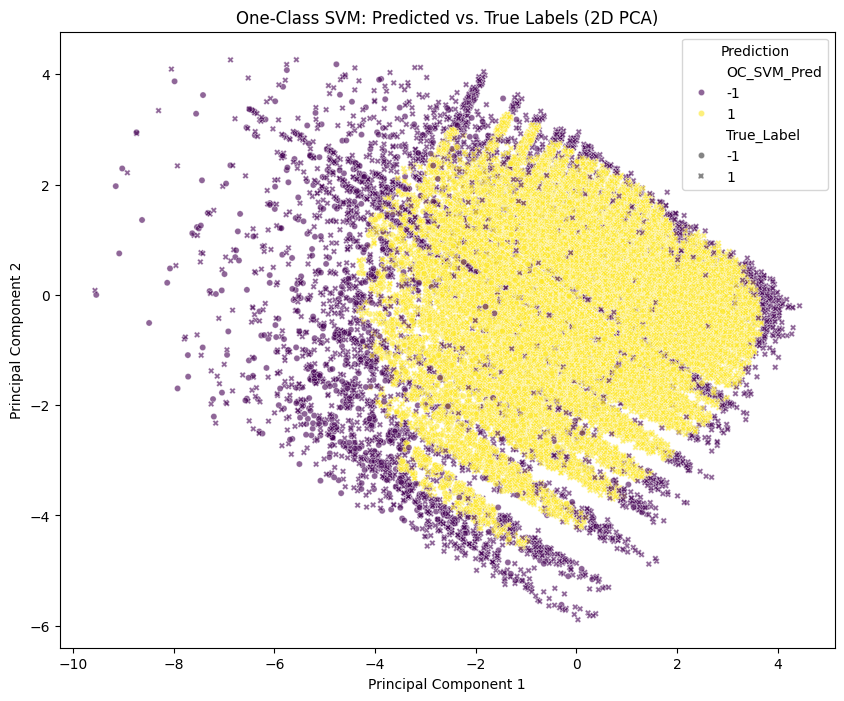


--- Visualizing Isolation Forest Predictions ---


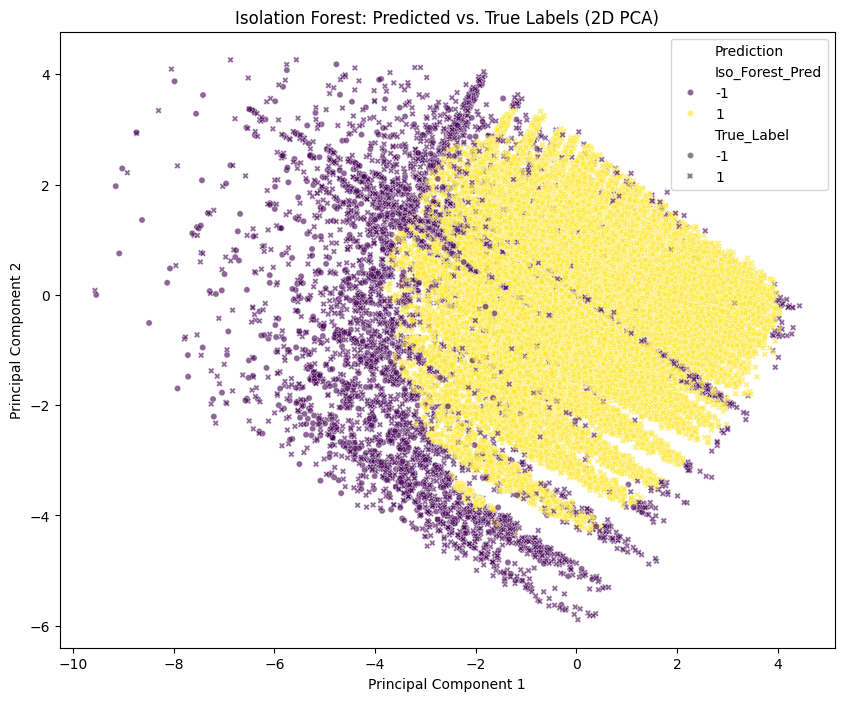

In [ ]:
# --- Step 1: Prepare the Data and Predictions ---
# You already have X_test, oc_svm_preds, and iso_forest_preds from the previous code block.
# Let's add the true labels for comparison.
# Remember to convert the true labels for the plot as well.
y_test_plot = y_test.apply(lambda x: -1 if x == 1 else 1)

# --- Step 2: Dimensionality Reduction using PCA ---
# We reduce the data to 2 principal components for plotting.
pca = PCA(n_components=2)
X_test_pca = pca.fit_transform(X_test_scaled)

# Add the reduced features and predictions to a DataFrame for easy plotting
plot_data = pd.DataFrame(data=X_test_pca, columns=['PC1', 'PC2'])
plot_data['True_Label'] = y_test_plot.values
plot_data['OC_SVM_Pred'] = oc_svm_preds
plot_data['Iso_Forest_Pred'] = iso_forest_preds

# --- Step 3: Visualize One-Class SVM Predictions ---
print("\n--- Visualizing One-Class SVM Predictions ---")
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='PC1',
    y='PC2',
    hue='OC_SVM_Pred',
    style='True_Label',
    palette='viridis',
    data=plot_data,
    s=20,
    alpha=0.6
)
plt.title('One-Class SVM: Predicted vs. True Labels (2D PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Prediction', loc='upper right')
plt.show()

# --- Step 4: Visualize Isolation Forest Predictions ---
print("\n--- Visualizing Isolation Forest Predictions ---")
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='PC1',
    y='PC2',
    hue='Iso_Forest_Pred',
    style='True_Label',
    palette='viridis',
    data=plot_data,
    s=20,
    alpha=0.6
)
plt.title('Isolation Forest: Predicted vs. True Labels (2D PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Prediction', loc='upper right')
plt.show()

#

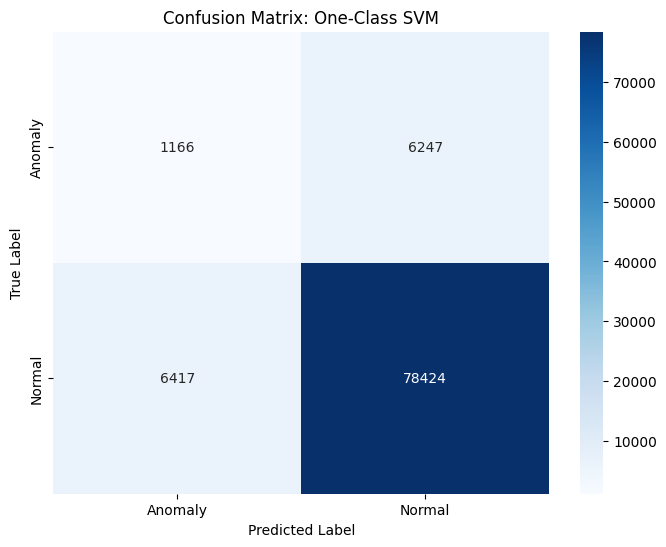

In [1]:
# Provided confusion matrix values for One-Class SVM
cm_oc_svm = np.array([[1166, 6247],
                      [6417, 78424]])

# Labels for the matrix
labels = ['Anomaly', 'Normal']

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_oc_svm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix: One-Class SVM')
plt.show()

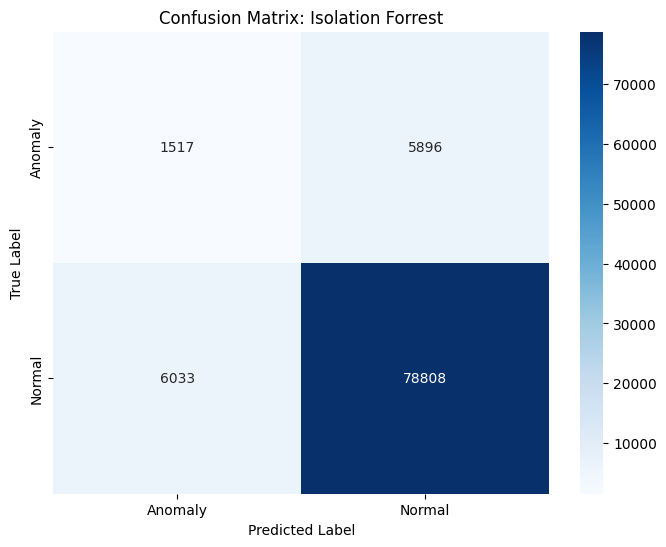

In [3]:
cm_oc_svm = np.array([[1517, 5896],
                      [6033, 78808]])

# Labels for the matrix
labels = ['Anomaly', 'Normal']

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_oc_svm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix: Isolation Forrest')
plt.show()